In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt


In [2]:
df=pd.read_csv("train.csv")

In [3]:
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
df.shape

(42000, 785)

In [5]:
df.sample()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
5100,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


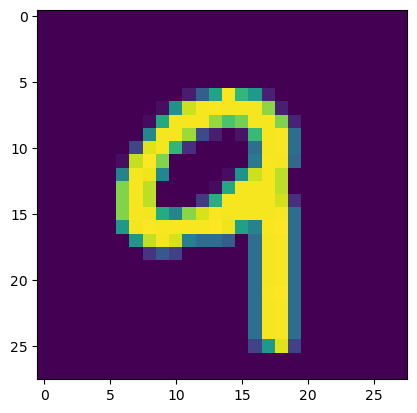

In [6]:
plt.imshow(df.iloc[13306,1:].values.reshape(28,28))

In [7]:
X=df.iloc[:,1:]
y=df.iloc[:,0]

In [8]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [9]:
X_train.shape

(33600, 784)

In [10]:
from sklearn.neighbors import KNeighborsClassifier


In [11]:
knn=KNeighborsClassifier()

In [12]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [13]:
#without pca 
import time
start=time.time()
y_pred=knn.predict(X_test)
print(time.time()-start)

6.154774188995361


In [14]:
from sklearn.metrics import accuracy_score

accuracy_score(y_test,y_pred)

0.9648809523809524

# using pca 

In [15]:
#standardization process
from sklearn.preprocessing import StandardScaler

scaler=StandardScaler()

In [16]:
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

In [17]:
#pca
from sklearn.decomposition import PCA
pca=PCA(n_components=100)# here u need to give how many components u want, if u give none it will take n columns for this 784 columns


In [18]:
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [19]:
X_train_trf.shape

(33600, 100)

In [20]:
knn=KNeighborsClassifier()

In [21]:
knn.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [22]:
y_pred=knn.predict(X_test_trf)

In [23]:
accuracy_score(y_test,y_pred)

0.9551190476190476

In [25]:
for i in range(1,784):
    pca=PCA(n_components=i)
    X_train_trf=pca.fit_transform(X_train)
    X_test_trf=pca.transform(X_test)
    
    knn=KNeighborsClassifier()
    knn.fit(X_train_trf,y_train)
    y_pred=knn.predict(X_test_trf)
    print(accuracy_score(y_test,y_pred))

0.25916666666666666
0.3236904761904762
0.5103571428571428
0.6660714285714285
0.7379761904761905
0.8227380952380953
0.8429761904761904
0.871547619047619
0.8864285714285715
0.9053571428571429
0.9117857142857143
0.9179761904761905
0.9273809523809524
0.935
0.9383333333333334
0.9391666666666667
0.9402380952380952
0.9395238095238095
0.9441666666666667
0.9439285714285715
0.9439285714285715
0.9439285714285715
0.944047619047619
0.945595238095238
0.9473809523809524
0.9478571428571428
0.9469047619047619
0.9472619047619047
0.9486904761904762
0.9494047619047619
0.9495238095238095
0.9508333333333333
0.9514285714285714
0.9496428571428571
0.9516666666666667
0.9511904761904761
0.9522619047619048
0.9523809523809523
0.9521428571428572
0.9526190476190476
0.9529761904761904
0.9517857142857142
0.9517857142857142
0.9529761904761904
0.9525
0.9534523809523809
0.9544047619047619
0.9536904761904762
0.9536904761904762
0.9526190476190476
0.9535714285714286
0.9532142857142857
0.9541666666666667
0.9536904761904762
0

KeyboardInterrupt: 

In [26]:
pca=PCA(n_components=2)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [27]:
import plotly.express as px

y_train_trf=y_train.astype(str)

fig=px.scatter(x=X_train_trf[:,0],
              y=X_train_trf[:,1],
              color=y_train_trf,
              color_discrete_sequence=px.colors.qualitative.G10)

fig.show()

In [28]:
pca=PCA(n_components=3)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [31]:


# Assuming y_train_trf is your target variable converted to string
# And X_train_trf is the PCA transformed training data

fig = px.scatter_3d(
    x=X_train_trf[:, 0],  # First principal component
    y=X_train_trf[:, 1],  # Second principal component
    z=X_train_trf[:, 2],  # Third principal component
    color=y_train_trf     # Coloring by target variable (as string)
)

fig.update_layout(margin=dict(l=20, r=20, t=20, b=20))
fig.show()


In [32]:
pca.explained_variance_
#eigen values

array([40.67111197, 29.17023383, 26.74459366])

In [33]:
pca.components_
#eigen vectors


array([[-1.35983412e-18,  8.31040204e-18, -2.56484266e-19, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 1.27901565e-16, -9.31213706e-17,  1.07631454e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-4.80956821e-17,  1.31763005e-16, -3.86603792e-18, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

# how to find out optimum number of priciple components

784= lamda1,lamda2, lamda n

each eigen vector how much percent variance it explains

lamda1/lamda1+lamda2+lamdan *100 = percentage value 

you should atleast explain 90 percent variance 



In [34]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])

In [36]:
pca=PCA(n_components=None)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [38]:
pca.components_.shape

(784, 784)

In [39]:
pca.explained_variance_ratio_

array([5.78519225e-02, 4.14926968e-02, 3.80423901e-02, 2.96626277e-02,
       2.58156168e-02, 2.25498018e-02, 1.97306802e-02, 1.77527998e-02,
       1.56865066e-02, 1.43606328e-02, 1.37025484e-02, 1.22725500e-02,
       1.14691200e-02, 1.12302739e-02, 1.05852885e-02, 1.01993106e-02,
       9.57676152e-03, 9.42708817e-03, 9.12489429e-03, 8.90170190e-03,
       8.39940495e-03, 8.20063196e-03, 7.85303229e-03, 7.56739707e-03,
       7.37261022e-03, 7.01884653e-03, 6.97919728e-03, 6.71104483e-03,
       6.39845030e-03, 6.30337291e-03, 6.15350848e-03, 6.02388659e-03,
       5.83673972e-03, 5.78547759e-03, 5.72333148e-03, 5.46399774e-03,
       5.43207369e-03, 5.28172755e-03, 5.13381744e-03, 4.94015474e-03,
       4.87671103e-03, 4.81978768e-03, 4.68204430e-03, 4.59342487e-03,
       4.57660834e-03, 4.49219022e-03, 4.44682221e-03, 4.41540749e-03,
       4.35111936e-03, 4.32032928e-03, 4.21808870e-03, 4.18243127e-03,
       4.07994349e-03, 4.02004913e-03, 3.98335855e-03, 3.94598812e-03,
      

In [40]:
# i will apply cumalitive sum and reach to 90

np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

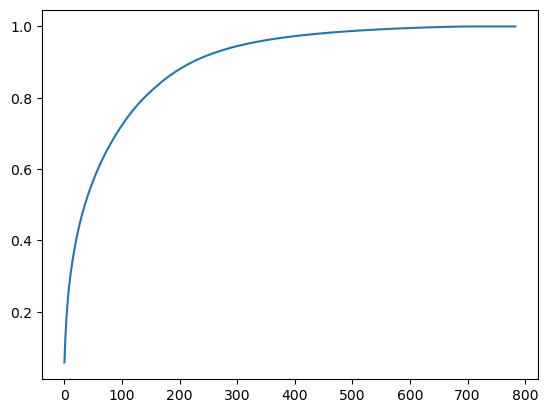

In [41]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))

so in above figure 90 percent is at 250 , n components required is 250 optimal 